In [1]:
#let us start by importing the relevant libraries

#Import all the necessary modules
import pandas as pandas
import numpy as numpy
import os
import matplotlib.pyplot as matplot
%matplotlib inline
import seaborn as sns
from Custom import Perform_EDA as EDA
import itertools

import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score,confusion_matrix, classification_report,roc_auc_score
from scipy.stats import zscore
from sklearn.model_selection import train_test_split

In [66]:
Source= pd.read_csv("vehicle-1.csv")

In [68]:
#Understand the data set

#Data skimmed through to see what are the variables present, data type, shape, column names, mixed data types, 
#missing values etc

Source.head(10)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus
5,107,NaN,106.0,172.0,50.0,6,255.0,26.0,28.0,169,280.0,957.0,264.0,85.0,5.0,9.0,181.0,183,bus
6,97,43.0,73.0,173.0,65.0,6,153.0,42.0,19.0,143,176.0,361.0,172.0,66.0,13.0,1.0,200.0,204,bus
7,90,43.0,66.0,157.0,65.0,9,137.0,48.0,18.0,146,162.0,281.0,164.0,67.0,3.0,3.0,193.0,202,van
8,86,34.0,62.0,140.0,61.0,7,122.0,54.0,17.0,127,141.0,223.0,112.0,64.0,2.0,14.0,200.0,208,van
9,93,44.0,98.0,NaN,62.0,11,183.0,36.0,22.0,146,202.0,505.0,152.0,64.0,4.0,14.0,195.0,204,car


In [69]:
Source.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
compactness                    846 non-null int64
circularity                    841 non-null float64
distance_circularity           842 non-null float64
radius_ratio                   840 non-null float64
pr.axis_aspect_ratio           844 non-null float64
max.length_aspect_ratio        846 non-null int64
scatter_ratio                  845 non-null float64
elongatedness                  845 non-null float64
pr.axis_rectangularity         843 non-null float64
max.length_rectangularity      846 non-null int64
scaled_variance                843 non-null float64
scaled_variance.1              844 non-null float64
scaled_radius_of_gyration      844 non-null float64
scaled_radius_of_gyration.1    842 non-null float64
skewness_about                 840 non-null float64
skewness_about.1               845 non-null float64
skewness_about.2               845 non-null float64
hollows_ratio    

In [70]:
Source.shape

(846, 19)

In [95]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder 
le = LabelEncoder() 
columns = Source.columns
#Let's Label Encode our class variable: 
print(columns)
Source['class'] = le.fit_transform(Source['class'])
Source.shape

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')


(846, 19)

# Print/ Plot the dependent (categorical variable) and Check for any missing values in the data

In [96]:
#Since the variable is categorical, you can use value_counts function
pandas.value_counts(Source['class'])

1    429
0    218
2    199
Name: class, dtype: int64

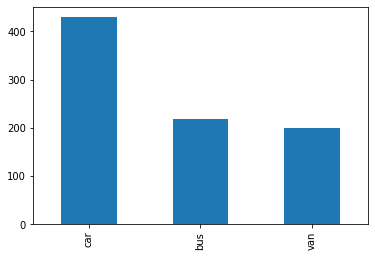

In [14]:
import matplotlib.pyplot as plt
%matplotlib inline
pandas.value_counts(Source["class"]).plot(kind="bar")

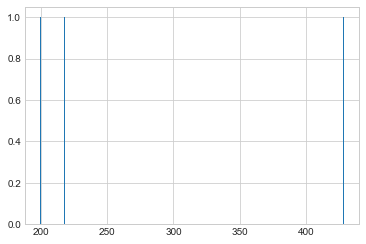

In [97]:
pandas.value_counts(Source['class']).hist(bins=300)

In [98]:
Source.isna().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [100]:
from sklearn.impute import SimpleImputer

newSource = Source.copy()

#interest_Source = newSource.drop('class', axis=1)
imputer = SimpleImputer(missing_values=np.nan, strategy='median', verbose=1)

#fill missing values with mean column values
transformed_values = imputer.fit_transform(newSource)

column = newSource.columns
print(column)
newdf = pd.DataFrame(transformed_values, columns = column )
newdf.describe()

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')


,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
count,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000,846.000000
mean,93.678487,44.823877,82.100473,168.874704,61.677305,8.567376,168.887707,40.936170,20.580378,147.998818,188.596927,439.314421,174.706856,72.443262,6.361702,12.600473,188.918440,195.632388,0.977541
std,8.234474,6.134272,15.741569,33.401356,7.882188,4.601217,33.197710,7.811882,2.588558,14.515652,31.360427,176.496341,32.546277,7.468734,4.903244,8.930962,6.152247,7.438797,0.702130
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,176.000000,181.000000,0.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,147.000000,33.000000,19.000000,137.000000,167.000000,318.250000,149.000000,67.000000,2.000000,5.000000,184.000000,190.250000,0.000000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,179.000000,363.500000,173.500000,71.500000,6.000000,11.000000,188.000000,197.000000,1.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,586.750000,198.000000,75.000000,9.000000,19.000000,193.000000,201.000000,1.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.000000,135.000000,22.000000,41.000000,206.000000,211.000000,2.000000


In [101]:
newdf.isna().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

In [102]:
from scipy.stats import zscore
interest_df_z = newdf.apply(zscore)

In [103]:
interest_df_z.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,0.160580,0.518073,0.057177,0.273363,1.310398,0.311542,-0.207598,0.136262,-0.224342,0.758332,-0.401920,-0.341934,0.285705,-0.327326,-0.073812,0.380870,-0.312012,0.183957,1.457086
1,-0.325470,-0.623732,0.120741,-0.835032,-0.593753,0.094079,-0.599423,0.520519,-0.610886,-0.344578,-0.593357,-0.619724,-0.513630,-0.059384,0.538390,0.156798,0.013265,0.452977,1.457086
2,1.254193,0.844303,1.519141,1.202018,0.548738,0.311542,1.148719,-1.144597,0.935290,0.689401,1.097671,1.109379,1.392477,0.074587,1.558727,-0.403383,-0.149374,0.049447,0.032005
3,-0.082445,-0.623732,-0.006386,-0.295813,0.167907,0.094079,-0.750125,0.648605,-0.610886,-0.344578,-0.912419,-0.738777,-1.466683,-1.265121,-0.073812,-0.291347,1.639649,1.529056,1.457086
4,-1.054545,-0.134387,-0.769150,1.082192,5.245643,9.444962,-0.599423,0.520519,-0.610886,-0.275646,1.671982,-0.648070,0.408680,7.309005,0.538390,-0.179311,-1.450481,-1.699181,-1.393075


In [104]:
newdf.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.00,119.0
circularity,846.0,44.823877,6.134272,33.0,40.00,44.0,49.00,59.0
distance_circularity,846.0,82.100473,15.741569,40.0,70.00,80.0,98.00,112.0
radius_ratio,846.0,168.874704,33.401356,104.0,141.00,167.0,195.00,333.0
pr.axis_aspect_ratio,846.0,61.677305,7.882188,47.0,57.00,61.0,65.00,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.00,55.0
scatter_ratio,846.0,168.887707,33.197710,112.0,147.00,157.0,198.00,265.0
elongatedness,846.0,40.936170,7.811882,26.0,33.00,43.0,46.00,61.0
pr.axis_rectangularity,846.0,20.580378,2.588558,17.0,19.00,20.0,23.00,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.00,188.0


In [35]:
#Quick Insights On descriptive stats:

# Compactness has mean and median values almost similar , it signifies that it is normally distribited 
# and has no skewness/outlier
# circularity : it also seems to be normally distribted as mean amd median has similar values
# scatter_ratio, Scaled variance 1 & 2 feature seems to be having some kind of skewness and outlier


In [105]:
newdf.shape

(846, 19)

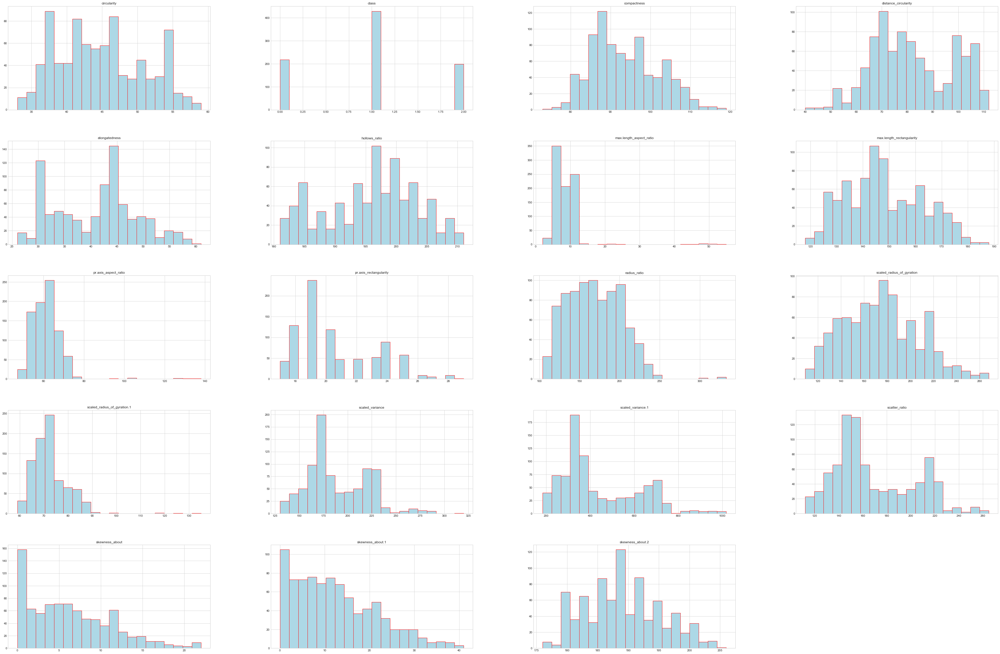

In [106]:
plt.style.use('seaborn-whitegrid')

newdf.hist(bins=20, figsize=(60,40), color='lightblue', edgecolor = 'red')
plt.show()

# Quick Observation :

Most of the data attributes seems to be normally distributed
scaled valriance 1 and skewness about 1 and 2, scatter_ratio, seems to be right skwed .
pr.axis_rectangularity seems to be hanging outliers as there are some gaps found in the bar plot

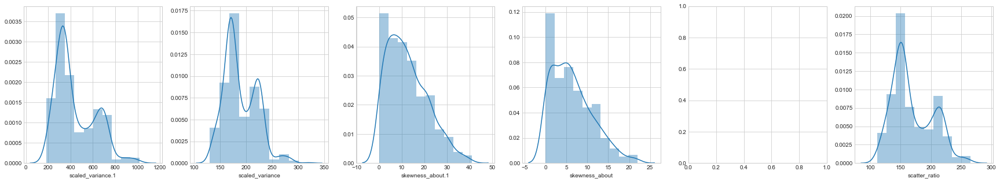

In [107]:
#Let us use seaborn distplot to analyze the distribution of our columns and see the skewness in attributes
f, ax = plt.subplots(1, 6, figsize=(30,5))
vis1 = sns.distplot(newdf["scaled_variance.1"],bins=10, ax= ax[0])
vis2 = sns.distplot(newdf["scaled_variance"],bins=10, ax=ax[1])
vis3 = sns.distplot(newdf["skewness_about.1"],bins=10, ax= ax[2])
vis4 = sns.distplot(newdf["skewness_about"],bins=10, ax=ax[3])
vis6 = sns.distplot(newdf["scatter_ratio"],bins=10, ax=ax[5])

f.savefig('subplot.png')

In [42]:
skewValue = newdf.skew()
print("skewValue of dataframe attributes:\n\n",skewValue)

skewValue of dataframe attributes:

 compactness                    0.381271
circularity                    0.264928
distance_circularity           0.108718
radius_ratio                   0.397572
pr.axis_aspect_ratio           3.835392
max.length_aspect_ratio        6.778394
scatter_ratio                  0.608710
elongatedness                  0.046951
pr.axis_rectangularity         0.774406
max.length_rectangularity      0.256359
scaled_variance                0.655598
scaled_variance.1              0.845345
scaled_radius_of_gyration      0.279910
scaled_radius_of_gyration.1    2.089979
skewness_about                 0.780813
skewness_about.1               0.689014
skewness_about.2               0.249985
hollows_ratio                 -0.226341
dtype: float64


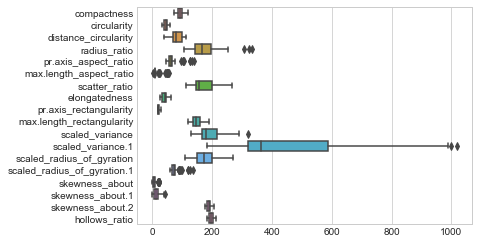

In [43]:
#Summary View of all attribute , The we will look into all the boxplot individually to trace out outliers

ax = sns.boxplot(data=newdf, orient="h")

Columns that are int32,int64 =  Index([], dtype='object')
Columns that are flaot32,float64 =  Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio'],
      dtype='object')
Columns that are objects =  Index([], dtype='object')


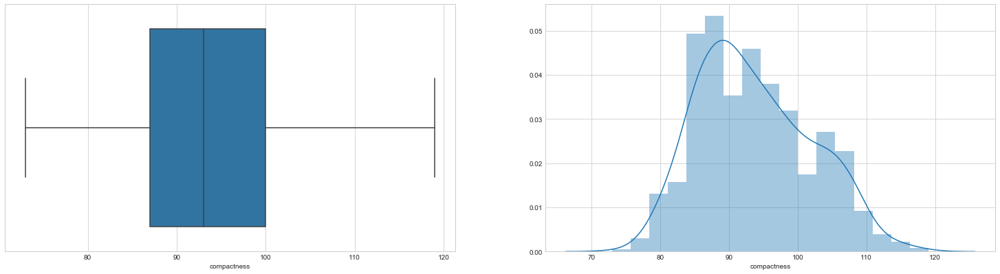

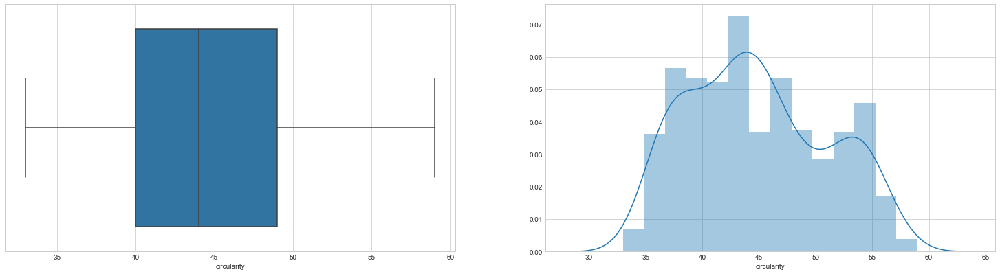

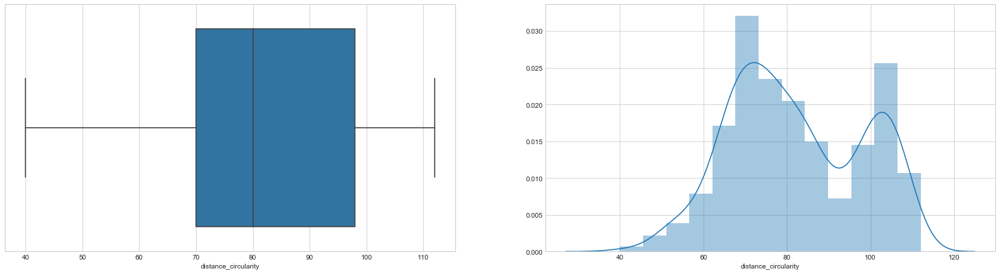

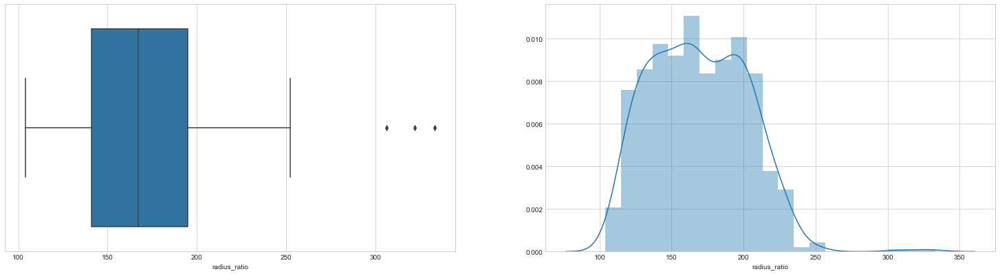

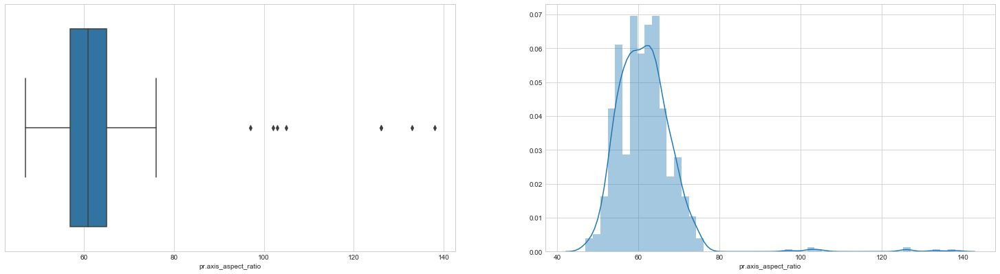

...

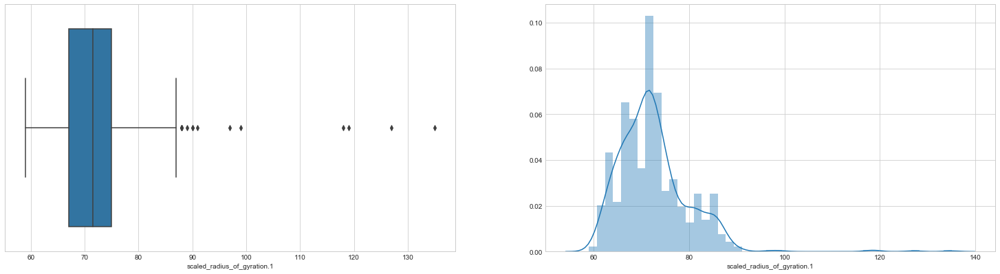

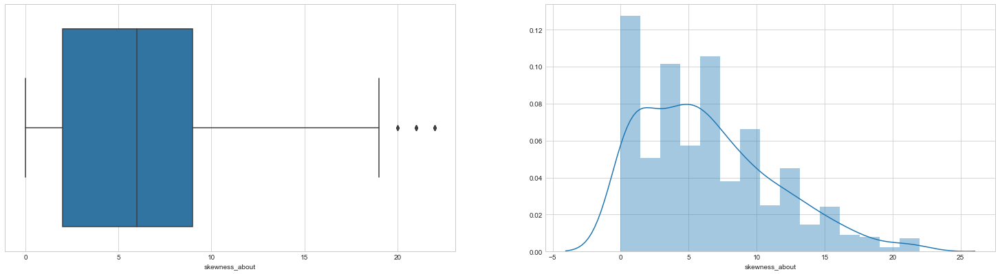

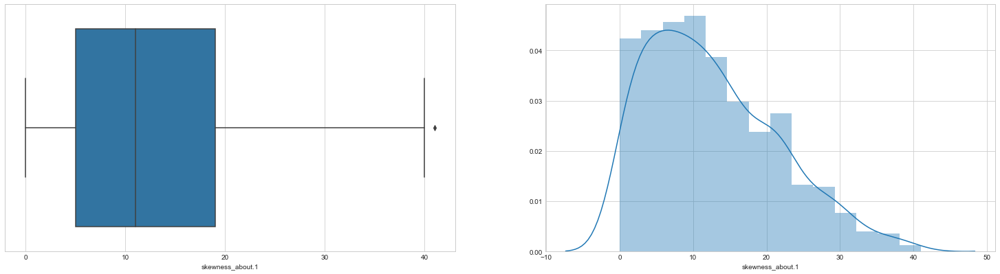

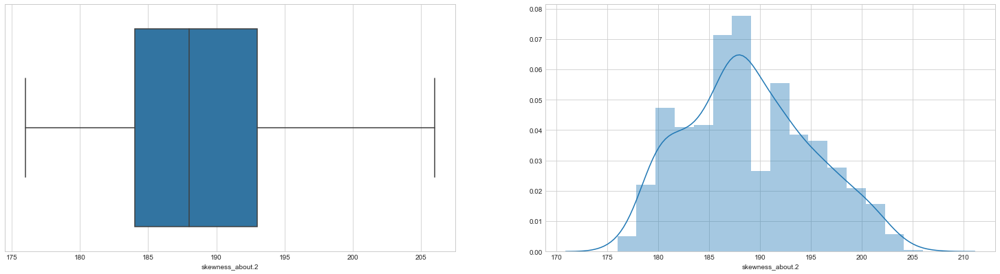

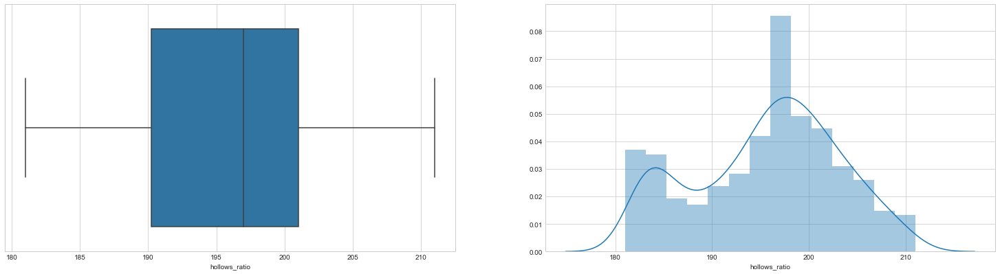

In [46]:
EDA.univariate_plots(newdf)

In [47]:
# Observation on boxplots:
# pr.axis_aspect_ratio, skewness_about, max_length_aspect_ratio, skewness_about_1,
# scaled_radius_of_gyration.1, scaled_variance.1, radius_ratio, skewness_about, 
# scaled_variance.1 are some of the attributes with outliers. 
# which is visible with all dotted points

In [108]:
# Treating Outliers Using IQR: Upper whisker
# The interquartile range (IQR), also called the midspread or middle 50%, or technically H-spread, 
# is a measure of statistical dispersion, being equal to the difference between 75th and 25th percentiles, 
# or between upper and lower quartiles, IQR = Q3 − Q1.

newdf.shape

(846, 19)

In [109]:
from scipy.stats import iqr

Q1 = newdf.quantile(0.25)
Q3 = newdf.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

compactness                     13.00
circularity                      9.00
distance_circularity            28.00
radius_ratio                    54.00
pr.axis_aspect_ratio             8.00
max.length_aspect_ratio          3.00
scatter_ratio                   51.00
elongatedness                   13.00
pr.axis_rectangularity           4.00
max.length_rectangularity       22.00
scaled_variance                 50.00
scaled_variance.1              268.50
scaled_radius_of_gyration       49.00
scaled_radius_of_gyration.1      8.00
skewness_about                   7.00
skewness_about.1                14.00
skewness_about.2                 9.00
hollows_ratio                   10.75
class                            1.00
dtype: float64


In [110]:
cleandf = newdf[~((newdf < (Q1 - 1.5 * IQR)) | (newdf > (Q3 + 1.5 * IQR))).any(axis=1)]
cleandf.shape

(813, 19)

# Let's Plot The Box Plot Once Agaian To See if outliers are removed.

Columns that are int32,int64 =  Index([], dtype='object')
Columns that are flaot32,float64 =  Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')
Columns that are objects =  Index([], dtype='object')


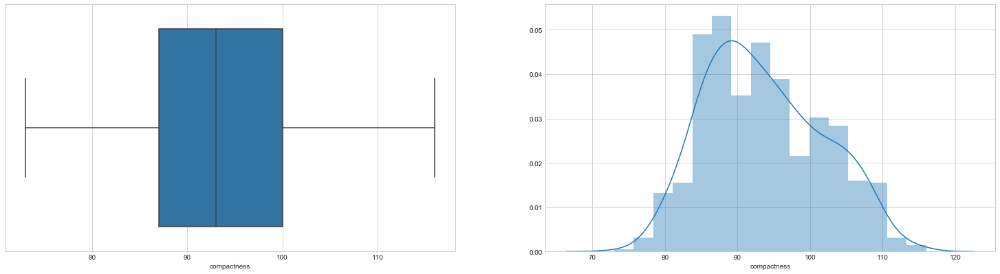

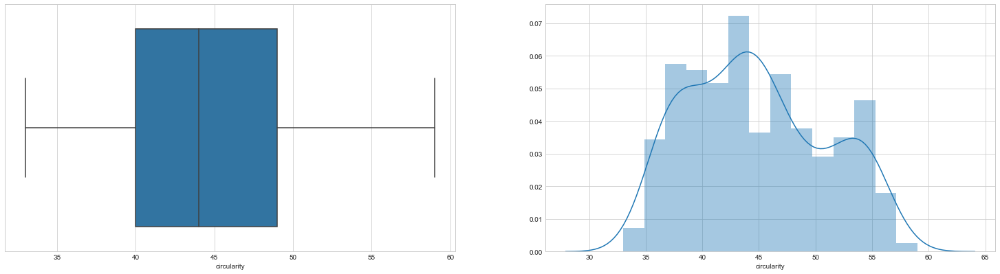

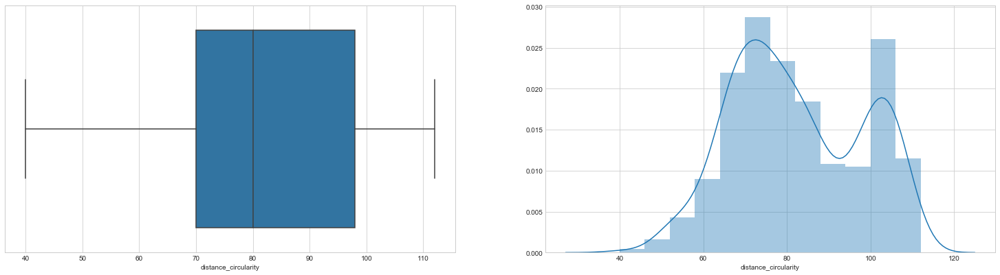

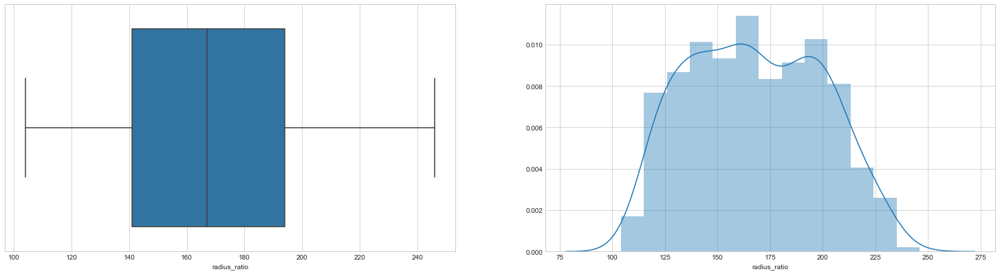

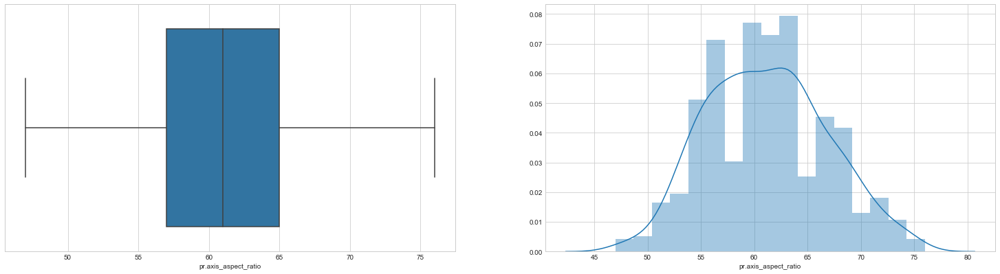

...

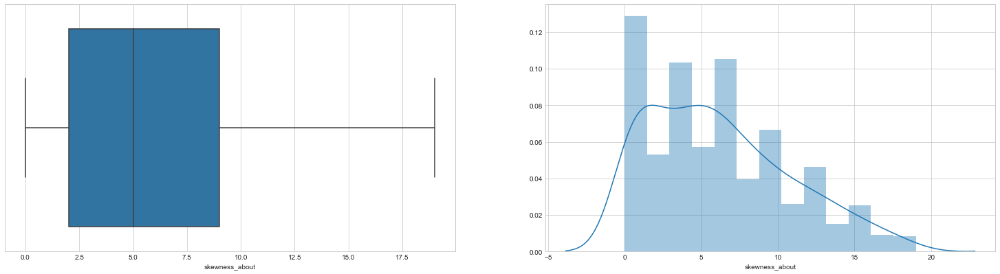

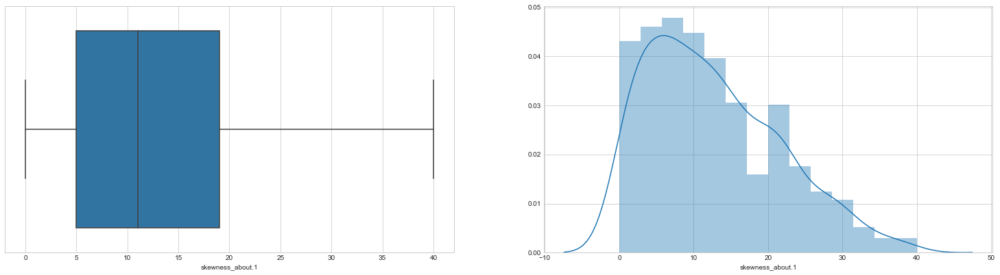

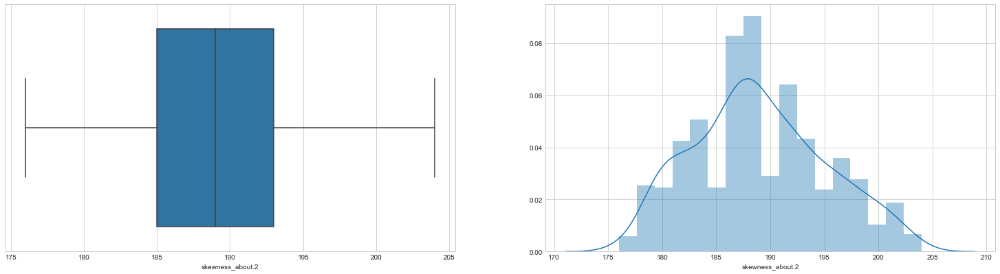

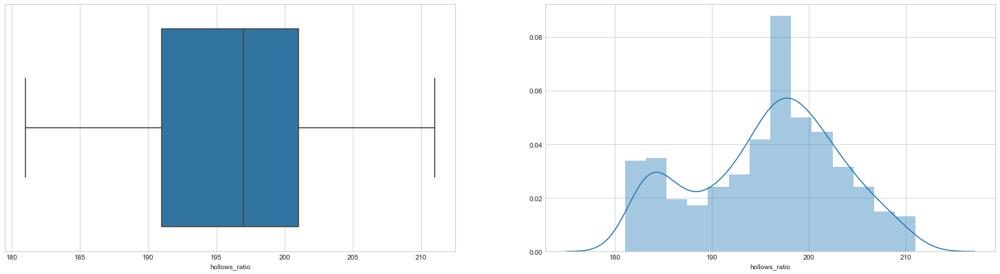

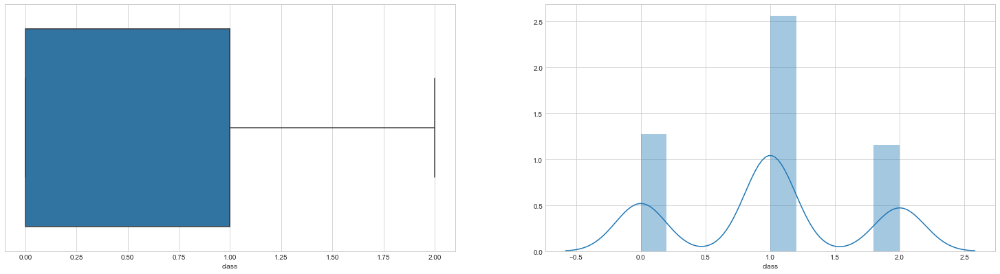

In [111]:
EDA.univariate_plots(cleandf)

In [52]:
# We can see that all out boxplot for all the attributes which had outlier have been treate and removed. 
# Since no. of outliers were less we opted to remove it. 
# Generally we avoid this as it can lead to info loss in case of large data sets with large no of outliers

# Understanding the relationship between all independent attribute

In [53]:
# Pearson Correlation Coefficient:
# We will use Pearson Correlation Coefficient to see what all attributes are linearly related and also 
# visualize the same in the seaborns scatter plot.

,Feature,Uniqueness,Positive rel,inverse rel,Pos,Neg,No
0,compactness,7,10,1,"[compactness, circularity, distance_circularit...",[elongatedness],"[pr.axis_aspect_ratio, max.length_aspect_ratio..."
1,circularity,7,10,1,"[compactness, circularity, distance_circularit...",[elongatedness],"[pr.axis_aspect_ratio, max.length_aspect_ratio..."
2,distance_circularity,7,10,1,"[compactness, circularity, distance_circularit...",[elongatedness],"[pr.axis_aspect_ratio, max.length_aspect_ratio..."
3,radius_ratio,6,11,1,"[compactness, circularity, distance_circularit...",[elongatedness],"[max.length_aspect_ratio, scaled_radius_of_gyr..."
4,pr.axis_aspect_ratio,15,3,0,"[radius_ratio, pr.axis_aspect_ratio, max.lengt...",[],"[compactness, circularity, distance_circularit..."
5,max.length_aspect_ratio,16,2,0,"[pr.axis_aspect_ratio, max.length_aspect_ratio]",[],"[compactness, circularity, distance_circularit..."
6,scatter_ratio,7,10,1,"[compactness, circularity, distance_circularit...",[elongatedness],"[pr.axis_aspect_ratio, max.length_aspect_ratio..."
7,elongatedness,7,1,10,[elongatedness],"[compactness, circularity, distance_circularit...","[pr.axis_aspect_ratio, max.length_aspect_ratio..."
8,pr.axis_rectangularity,7,10,1,"[compactness, circularity, distance_circularit...",[elongatedness],"[pr.axis_aspect_ratio, max.length_aspect_ratio..."
9,max.length_rectangularity,7,10,1,"[compactness, circularity, distance_circularit...",[elongatedness],"[pr.axis_aspect_ratio, max.length_aspect_ratio..."


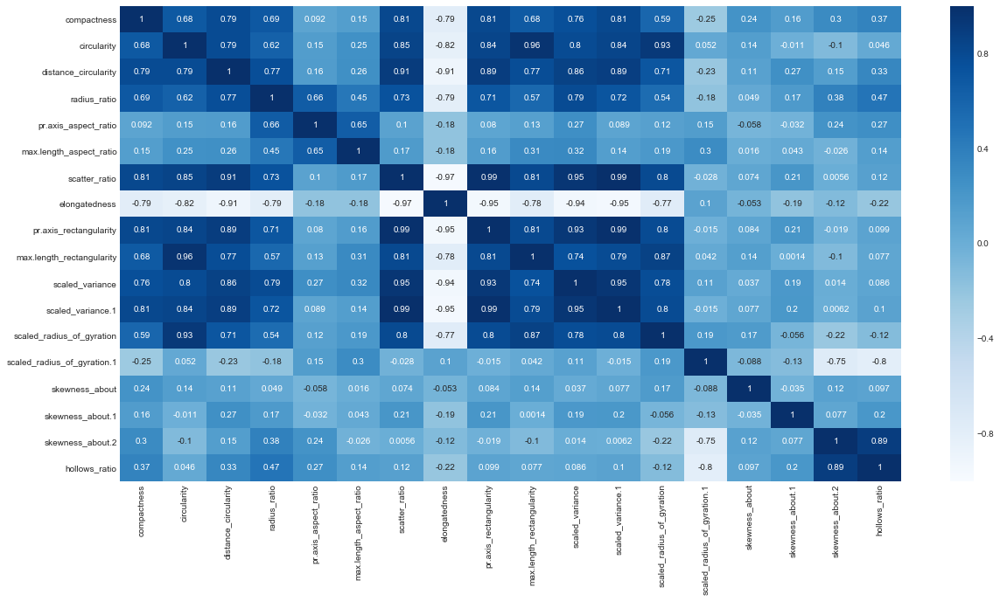

In [256]:
cleandf= newdf.drop('class', axis=1)

EDA.EDA_Corr(cleandf)

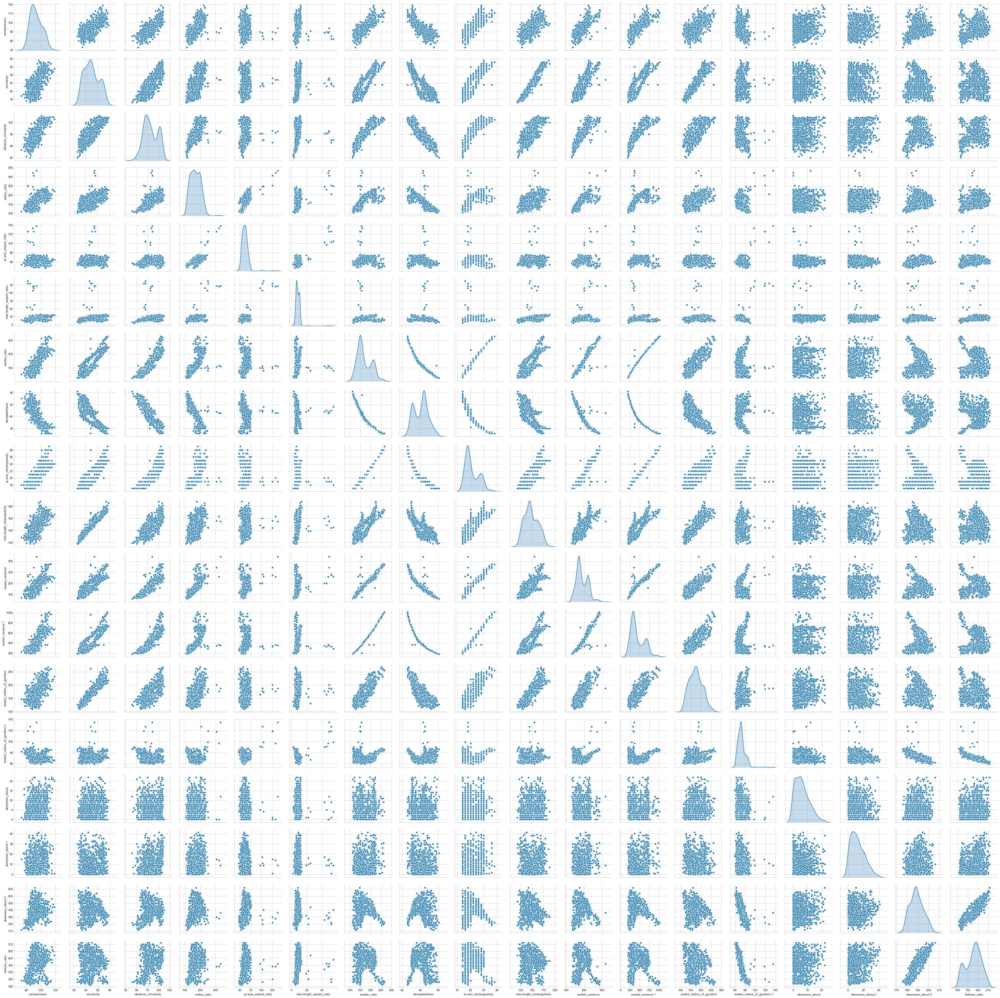

In [257]:
#compare all attributes visually to check for relationships that can be exploited
sns.pairplot(cleandf, diag_kind="kde")

In [56]:
# Scaled Variance & Scaled Variance.1 seems to be have very strong positive correlation with value of 0.98. 
# skewness_about_2 and hollow_ratio also seems to have strong positive correation with coeff: 0.89

# scatter_ratio and elongatedness seems to be have very strong negative correlation. 
# elongatedness and pr.axis_rectangularity seems to have strong negative correlation.

In [57]:
# From above correlation matrix we can see that there are many features which are highly correlated. 
# If we carefully analyse, we will find that many features are there which having more than 0.9 correlation. 
# so we can decide to get rid of those columns whose correlation is +-0.9 or above.T
# There are 8 such columns:

# max.length_rectangularity
# scaled_radius_of_gyration
# skewness_about.2
# scatter_ratio
# elongatedness
# pr.axis_rectangularity
# scaled_variance
# scaled_variance.1

# Principle Component Analysis (PCA)

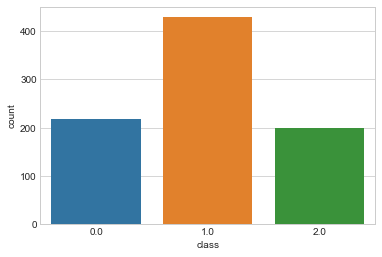

In [258]:
#display how many are car,bus,van. 


sns.countplot(newdf["class"])

In [82]:
# Basically PCA is a dimension redcuction methodology which aims to reduce a large set of (often correlated) 
# variables into a smaller set of (uncorrelated) variables, called principal components, which holds sufficient 
# information without loosing the the relevant info much.

# Principal components are new variables that are constructed as linear combinations or mixtures of the 
# initial variables. These combinations are done in such a way that the new variables (i.e., principal components) 
# are uncorrelated and most of the information within the initial variables is squeezed or compressed into the 
# first components.



In [83]:
# Lets perform PCA in following steps:
# 1. Split our data into train and test data set
# 2. Normalize the tarining set using standard scalar
# 3. Calculate the covariance matrix.
# 4. Calculate the eigenvectors and their eigenvalues.
# 5. Sort the eigenvectors according to their eigenvalues in descending order.
# 6. Choose the first K eigenvectors (where k is the dimension we'd like to end up with).
# 7. Build new dataset with reduced dimensionality.

In [239]:
# Separate The Data Into Independent & Dependent attribute

X = newdf.iloc[:,0:18].values
y = newdf.iloc[:,18].values

X

array([[ 95.,  48.,  83., ...,  16., 187., 197.],
       [ 91.,  41.,  84., ...,  14., 189., 199.],
       [104.,  50., 106., ...,   9., 188., 196.],
       ...,
       [106.,  54., 101., ...,   4., 187., 201.],
       [ 86.,  36.,  78., ...,  25., 190., 195.],
       [ 85.,  36.,  66., ...,  18., 186., 190.]])

In [265]:
# Scaling The Independent Data Set
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_std =  sc.fit_transform(X)      

X_std

array([[ 0.16058035,  0.51807313,  0.05717723, ...,  0.3808703 ,
        -0.31201194,  0.18395733],
       [-0.32546965, -0.62373151,  0.12074088, ...,  0.15679779,
         0.01326483,  0.45297703],
       [ 1.25419283,  0.84430302,  1.51914112, ..., -0.40338349,
        -0.14937355,  0.04944748],
       ...,
       [ 1.49721783,  1.49676282,  1.20132288, ..., -0.96356477,
        -0.31201194,  0.72199673],
       [-0.93303214, -1.43930625, -0.26064101, ...,  1.38919659,
         0.17590322, -0.08506238],
       [-1.05454464, -1.43930625, -1.02340478, ...,  0.60494281,
        -0.47465032, -0.75761164]])

In [266]:
# Calculating covariance matrix

cov_matrix = numpy.cov(X_std.T)
print("cov_matrix shape:",cov_matrix.shape)
print("Covariance_matrix",cov_matrix)

cov_matrix shape: (18, 18)
Covariance_matrix [[ 1.00118343  0.68569786  0.79086299  0.69055952  0.09164265  0.14842463
   0.81358214 -0.78968322  0.81465658  0.67694334  0.76297234  0.81497566
   0.58593517 -0.24988794  0.23635777  0.15720044  0.29889034  0.36598446]
 [ 0.68569786  1.00118343  0.79325751  0.6216467   0.15396023  0.25176438
   0.8489411  -0.82244387  0.84439802  0.96245572  0.79724837  0.83693508
   0.92691166  0.05200785  0.14436828 -0.01145212 -0.10455005  0.04640562]
 [ 0.79086299  0.79325751  1.00118343  0.76794246  0.15864319  0.26499957
   0.90614687 -0.9123854   0.89408198  0.77544391  0.86253904  0.88706577
   0.70660663 -0.22621115  0.1140589   0.26586088  0.14627113  0.33312625]
 [ 0.69055952  0.6216467   0.76794246  1.00118343  0.66423242  0.45058426
   0.73529816 -0.79041561  0.70922371  0.56962256  0.79435372  0.71928618
   0.53700678 -0.18061084  0.04877032  0.17394649  0.38266622  0.47186659]
 [ 0.09164265  0.15396023  0.15864319  0.66423242  1.00118343  

In [267]:
# Calculating Eigen Vectors & Eigen Values: Using numpy linear algebra function

eigenvalues, eigenvectors = numpy.linalg.eig(cov_matrix)
print('Eigen Vectors \n%s', eigenvectors)
print('\n Eigen Values \n%s', eigenvalues)

Eigen Vectors 
%s [[ 2.75283688e-01  1.26953763e-01  1.19922479e-01 -7.83843562e-02
  -6.95178336e-02  1.44875476e-01  4.51862331e-01  5.66136785e-01
   4.84418105e-01  2.60076393e-01 -4.65342885e-02  1.20344026e-02
  -1.56136836e-01 -1.00728764e-02 -6.00532537e-03  6.00485194e-02
  -6.50956666e-02 -9.67780251e-03]
 [ 2.93258469e-01 -1.25576727e-01  2.48205467e-02 -1.87337408e-01
   8.50649539e-02 -3.02731148e-01 -2.49103387e-01  1.79851809e-01
   1.41569001e-02 -9.80779086e-02 -3.01323693e-03 -2.13635088e-01
  -1.50116709e-02 -9.15939674e-03  7.38059396e-02 -4.26993118e-01
  -2.61244802e-01 -5.97862837e-01]
 [ 3.04609128e-01  7.29516436e-02  5.60143254e-02  7.12008427e-02
  -4.06645651e-02 -1.38405773e-01  7.40350569e-02 -4.34748988e-01
   1.67572478e-01  2.05031597e-01 -7.06489498e-01  3.46330345e-04
   2.37111452e-01  6.94599696e-03 -2.50791236e-02  1.46240270e-01
   7.82651714e-02 -1.57257142e-01]
 [ 2.67606877e-01  1.89634378e-01 -2.75074211e-01  4.26053415e-02
   4.61473714e-02  

In [268]:
# Find variance and cumulative variance by each eigen vector

tot = sum(eigenvalues)
var_exp = [( i /tot ) * 100 for i in sorted(eigenvalues, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
print("Cumulative Variance Explained", cum_var_exp)

Cumulative Variance Explained [ 52.18603365  68.9158021   79.47844095  86.02590063  91.11576952
  94.11218252  96.10354875  97.33504945  98.22626473  98.73597943
  99.10498391  99.36357011  99.5621946   99.71430385  99.82849808
  99.92791726  99.98355026 100.        ]


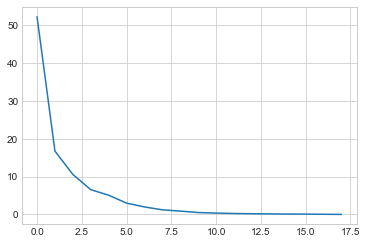

In [269]:
plt.plot(var_exp)

# Plotting The Explained Variance and Princiapl Components

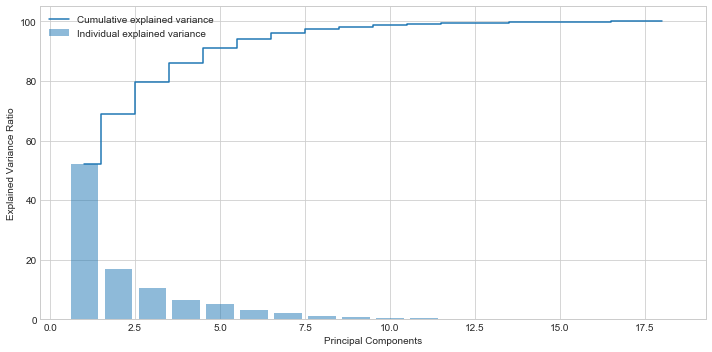

In [270]:
# Ploting 
plt.figure(figsize=(10 , 5))
plt.bar(range(1, eigenvalues.size + 1), var_exp, alpha = 0.5, align = 'center', label = 'Individual explained variance')
plt.step(range(1, eigenvalues.size + 1), cum_var_exp, where='mid', label = 'Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc = 'best')
plt.tight_layout()
plt.show()

In [130]:
# From above plot we can clearly observer that 8 dimension() are able to explain 95 %variance of data. 
# so we will use first 8 principal components going forward and calulate the reduced dimensions. 

In [271]:
# Make a set of (eigenvalue, eigenvector) pairs:

eig_pairs = [(eigenvalues[index], eigenvectors[:,index]) for index in range(len(eigenvalues))]

# Sort the (eigenvalue, eigenvector) pairs from highest to lowest with respect to eigenvalue
eig_pairs.sort()

eig_pairs.reverse()
print(eig_pairs)

# Extract the descending ordered eigenvalues and eigenvectors
eigvalues_sorted = [eig_pairs[index][0] for index in range(len(eigenvalues))]
eigvectors_sorted = [eig_pairs[index][1] for index in range(len(eigenvalues))]

# Let's confirm our sorting worked, print out eigenvalues
print('Eigenvalues in descending order: \n%s' %eigvalues_sorted)

[(9.404602609088705, array([ 0.27528369,  0.29325847,  0.30460913,  0.26760688,  0.08050399,
        0.09727569,  0.31709275, -0.31413315,  0.31395906,  0.2828309 ,
        0.30928036,  0.31378846,  0.27204749, -0.02081377,  0.04145551,
        0.05822502,  0.03027951,  0.07414539])), (3.014922058524633, array([ 0.12695376, -0.12557673,  0.07295164,  0.18963438,  0.12217486,
       -0.01074829, -0.04811814, -0.01274985, -0.05993525, -0.11622053,
       -0.06228062, -0.05378436, -0.20923317, -0.48852515,  0.05508997,
        0.12408509,  0.54091477,  0.54035426])), (1.9035250218389657, array([ 0.11992248,  0.02482055,  0.05601433, -0.27507421, -0.64201297,
       -0.5918013 ,  0.09762831, -0.05764844,  0.10951242,  0.0170642 ,
       -0.05632398,  0.10884073,  0.03146365, -0.28627701,  0.11567935,
        0.07528289, -0.00873592, -0.03952427])), (1.1799374684450215, array([-0.07838436, -0.18733741,  0.07120084,  0.04260534, -0.03272571,
       -0.03141473,  0.09574857, -0.0822902 ,  0.0

# Dimensionality Reduction

In [414]:
# P_reduce represents reduced mathematical space....

P_reduce = np.array(eigvectors_sorted[0:8])   # Reducing from 18 to 8 dimension space

X_std_8D = np.dot(X_std, P_reduce.T)   # projecting original data into principal component dimensions

reduced_pca = pd.DataFrame(X_std_8D)  # converting array to dataframe for pairplot

reduced_pca


,0,1,2,3,4,5,6,7
0,0.334162,0.219026,-1.001584,-0.176612,-0.079301,-0.757447,-0.901124,0.381106
1,-1.591711,0.420603,0.369034,-0.233234,-0.693949,-0.517162,0.378637,-0.247059
2,3.769324,-0.195283,-0.087859,-1.202212,-0.731732,0.705041,-0.034584,-0.482772
3,-1.738598,2.829692,-0.109456,-0.376685,0.362897,-0.484431,0.470753,0.023086
4,0.558103,-4.758422,-11.703647,-0.147464,-3.256953,-0.203446,2.671578,0.448854
5,5.788913,-3.680602,2.010549,0.771052,0.393432,1.571298,1.266585,-0.172753
6,-0.773309,2.209779,0.124292,-2.114305,0.192185,0.791615,-0.147108,0.399470
7,-2.141137,1.176398,-0.655974,-0.825056,1.242390,-0.643791,-0.137203,0.417908
8,-4.458273,3.097744,-0.100556,0.551469,0.568003,-0.278121,0.291617,0.383483
9,0.937564,1.827625,0.076417,0.641740,0.404678,-0.343602,0.661844,-0.890702


# Let us check The Pairplot Of Reduced Dimension After PCA

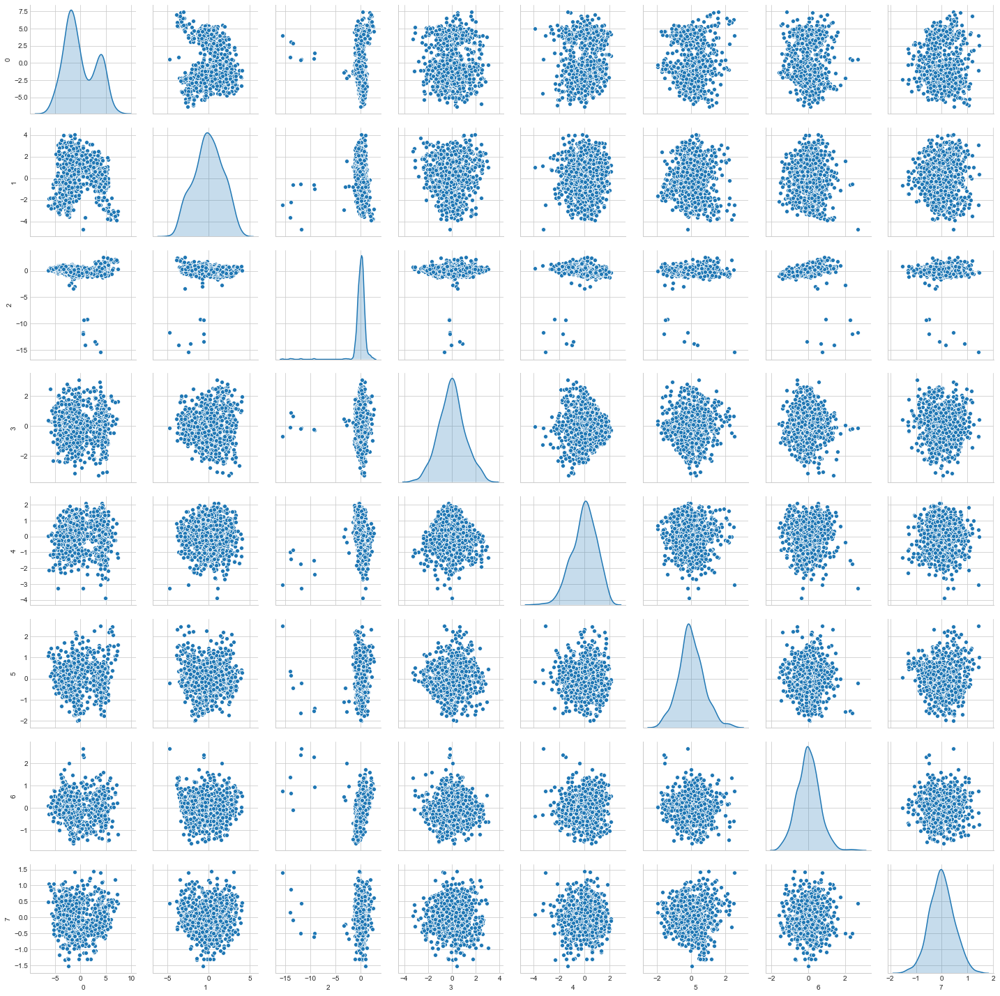

In [415]:
sns.pairplot(reduced_pca, diag_kind='kde') 

In [134]:
# After dimensionality reduction using PCA our attributes have become independent with no correlation 
# among themselves. As most of them have cloud of data points with no lienaer kind of relationship.

# Fitting Model and measuring score 

In [135]:
# Let's build two Support Vector Classifier Model one with 18 original independent variables and 
# the second one with only the 8 new reduced variables constructed using PCA.

In [416]:
#now split the data into 70:30 ratio

#orginal Data
Orig_X_train,Orig_X_test,Orig_y_train,Orig_y_test = train_test_split(X_std, y, test_size=0.30, random_state=1)

#PCA Data
pca_X_train,pca_X_test,pca_y_train,pca_y_test = train_test_split(reduced_pca, y, test_size=0.30, random_state=1)

In [417]:
# Fitting SVC model On Original Data

svc = SVC() #instantiate the object

In [418]:
# fit the model on orighinal raw data
svc.fit(Orig_X_train, Orig_y_train)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='rbf', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)

In [419]:
# predict the y value
Orig_y_predict = svc.predict(Orig_X_test)

In [420]:
# Fitting SVC ON PCA Data


svc1 = SVC() #instantiate the object
svc1.fit(pca_X_train, pca_y_train)

#predict the y value
pca_y_predict = svc1.predict(pca_X_test)

In [421]:
# Display accuracy score of both models

SVC_Org_Score = svc.score(Orig_X_test, Orig_y_test)
print("Model Score On Original Data ", SVC_Org_Score)
SVC_PCA8_Score = svc1.score(pca_X_test, pca_y_test)
print("Model Score On Reduced PCA Dimension ",SVC_PCA8_Score)

SVC_Org_Accuracy = accuracy_score(Orig_y_test, Orig_y_predict)
print("Before PCA On Original 18 Dimension", SVC_Org_Accuracy)
SVC_PCA8_Accuracy = accuracy_score(pca_y_test, pca_y_predict)
print("After PCA (On 8 dimension)", SVC_PCA8_Accuracy)

SVC_Org_CrossScore = cross_val_score(svc, X_std, y, cv=10, scoring='accuracy').mean()
print('Cross Validation Score [Scaled]', SVC_Org_CrossScore)
SVC_PCA8_CrossScore = cross_val_score(svc1, reduced_pca, y, cv=10, scoring='accuracy').mean()
print('Cross Validation Score [PCA]', SVC_PCA8_CrossScore)

Model Score On Original Data  0.952755905511811
Model Score On Reduced PCA Dimension  0.9330708661417323
Before PCA On Original 18 Dimension 0.952755905511811
After PCA (On 8 dimension) 0.9330708661417323
Cross Validation Score [Scaled] 0.966873676299788
Cross Validation Score [PCA] 0.9480501468880235


In [142]:
# Observations
# On training data set we saw that our support vector classifier without performing PCA has an 
# accuracy score of 95 %
# But when we applied the SVC model on PCA componenets(reduced dimensions) our model scored 93 %.
# Considering that original dataframe had 18 dimensions and After PCA dimension reduced to 8, 
# our model has fared well in terms of accuracy score.

# Confusion Matrix

In [422]:
# Calculate Confusion Matrix & PLot To Visualize it

def draw_confmatrix(y_test, yhat, str1, str2, str3, datatype ):
    #Make predictions and evalute
    cm = confusion_matrix( y_test, yhat, [0,1,2] )
    print("Confusion Matrix For :", "\n",datatype, cm )
    sns.heatmap(cm, annot=True,  cmap='Blues',fmt='g', xticklabels = [str1, str2,str3] , yticklabels = [str1, str2,str3] )
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

Confusion Matrix For : 
 Original Data Set
 [[ 58   0   1]
 [  1 129   3]
 [  6   1  55]]


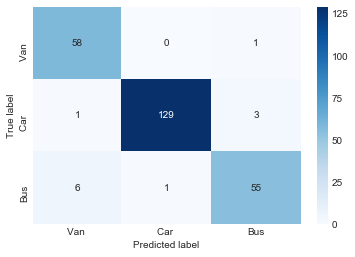

Confusion Matrix For : 
 For Reduced Dimensions Using PCA
 [[ 57   2   0]
 [  2 126   5]
 [  1   7  54]]


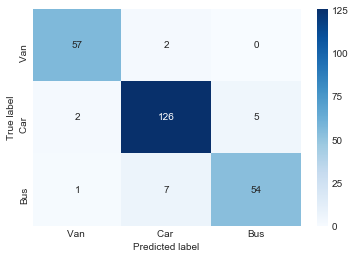

In [423]:
draw_confmatrix(Orig_y_test, Orig_y_predict,"Van ", "Car ", "Bus", "Original Data Set\n" )
draw_confmatrix(pca_y_test, pca_y_predict,"Van ", "Car ", "Bus", "For Reduced Dimensions Using PCA\n")

In [159]:
# Confusion Metric Analysis ON Original Data
#
# Original Data Set [[ 58 0 1] [ 1 129 3] [ 6 1 55]]
#
# Our model on original data set has correctly classified 58 van out of 59 actuals vans and 
# has errored only in one case where it has wrongly predicted van to be a bus.  
#
# In case of 133 actual cars our svm model has correcly classified 129 cars. it has wrongly classified 3 cars 
# to be a bus and also 1 car to be a van.
# 
# In case of 62 instances of actual bus , our model has correctly classified 55 buses , It has faltered in 
# classifying wrongly 6 buses to be a van and 1 bus to be a car

In [163]:
# Confusion Metric Analysis ON Reduced Dimesnion After PCA
# 
# For Reduced Dimensions Using PCA[[ 57  2  0][  2 126 5][ 1 7 54]]
# 
# Out of 59 actual instances of vans our model has correctly predicted 57 vans and 
# errored in 2 instances where it wrongly classified vans to be a car.
#
# Out of 133 actuals cars , our mdoel has correclty classified 126 of them to be a  car and 
# faltered in 7 cases where it wrongly classified 5 cars to a bus and 2 cars to be a van.
# 
# Out of 62 actual bus, our model has correclty classified 54 of them to be a bus. 
# It has faltered in 8 cases where it wrongly classified 7 bus to be a car and 1 bus to be a van.


In [164]:
#Classification Report Of Model built on Raw Data
print("Classification Report For Raw Data:", "\n", classification_report(Orig_y_test, Orig_y_predict))

#Classification Report Of Model built on Principal Components:
print("Classification Report For PCA:","\n", classification_report(pca_y_test, pca_y_predict))

Classification Report For Raw Data: 
               precision    recall  f1-score   support

         0.0       0.89      0.98      0.94        59
         1.0       0.99      0.97      0.98       133
         2.0       0.93      0.89      0.91        62

    accuracy                           0.95       254
   macro avg       0.94      0.95      0.94       254
weighted avg       0.95      0.95      0.95       254

Classification Report For PCA: 
               precision    recall  f1-score   support

         0.0       0.95      0.97      0.96        59
         1.0       0.93      0.95      0.94       133
         2.0       0.92      0.87      0.89        62

    accuracy                           0.93       254
   macro avg       0.93      0.93      0.93       254
weighted avg       0.93      0.93      0.93       254



In [165]:
# On original data

# our model has 99 % precision score when it comes to classify car from the given set of silhoutte parameters. 
# It has 89 % precision when it comes to classifying the input as van, 
# while it has 93 % precison when it come to predict data as bus

In [166]:
# On Reduced Dimensions After PCA

# Our model has highest precision score of 95 % when it comes to predict van type, 
# which is better as compared to predcition done on original data set, 
# which came out with the precision score of 89 % for van.

# Let's look ow some other classifier models perform both on original data & PCA data sets

# Logistic Regression

In [375]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()


model.fit(Orig_X_train, Orig_y_train)
Logistic_Org_Score = model.score(Orig_X_test, Orig_y_test)
print ('Before PCA score', Logistic_Org_Score)

model.fit(pca_X_train, pca_y_train)
Logistic_PCA_Score = model.score(pca_X_test, pca_y_test)
print ('After PCA score', Logistic_PCA_Score)

Logistic_Org_CrossScore = cross_val_score(model, X_std, y, cv=10, scoring='accuracy').mean()
print('Cross Validation Score [Scaled]', Logistic_Org_CrossScore)
Logistic_PCA8_CrossScore = cross_val_score(model, reduced_pca, y, cv=10, scoring='accuracy').mean()
print('Cross Validation Score [PCA]', Logistic_PCA8_CrossScore)

Before PCA score 0.937007874015748
After PCA score 0.8188976377952756
Cross Validation Score [Scaled] 0.9338324110131857
Cross Validation Score [PCA] 0.8251407392225183


# Naive Bayes

In [382]:
from sklearn.naive_bayes import GaussianNB

nb = GaussianNB()

nb.fit(Orig_X_train, Orig_y_train)
NB_Org_Score = nb.score(Orig_X_test, Orig_y_test)
print ('Before PCA score', NB_Org_Score)

nb.fit(pca_X_train, pca_y_train)
NB_PCA8_Score = nb.score(pca_X_test, pca_y_test)
print ('After PCA score', NB_PCA8_Score)

NB_Org_CrossScore = cross_val_score(nb, X_std, y, cv=10, scoring='accuracy').mean()
print('Cross Validation Score [Scaled]', NB_Org_CrossScore)
NB_PCA8_CrossScore = cross_val_score(nb, reduced_pca, y, cv=10, scoring='accuracy').mean()
print('Cross Validation Score [PCA]', NB_PCA8_CrossScore)

Before PCA score 0.5826771653543307
After PCA score 0.7598425196850394
Cross Validation Score [Scaled] 0.5922480699596911
Cross Validation Score [PCA] 0.7944524151123865


# DecisionTree

In [392]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(criterion = 'entropy' )

dt_model.fit(Orig_X_train, Orig_y_train)
DT_Org_Score = dt_model.score(Orig_X_test, Orig_y_test)
print ('Before PCA score', DT_Org_Score)

dt_model.fit(pca_X_train, pca_y_train)
DT_PCA8_Score = dt_model.score(pca_X_test, pca_y_test)
print ('After PCA score', DT_PCA8_Score)

DT_Org_CrossScore = cross_val_score(dt_model, X_std, y, cv=10, scoring='accuracy').mean()
print('Cross Validation Score [Scaled]', DT_Org_CrossScore)
DT_PCA8_CrossScore = cross_val_score(dt_model, reduced_pca, y, cv=10, scoring='accuracy').mean()
print('Cross Validation Score [PCA]', DT_PCA8_CrossScore)

Before PCA score 0.8858267716535433
After PCA score 0.8503937007874016
Cross Validation Score [Scaled] 0.9196426863428299
Cross Validation Score [PCA] 0.8438932158229144


In [393]:
Compare = [[SVC_Org_Accuracy, SVC_Org_CrossScore],
           [SVC_PCA8_Accuracy, SVC_PCA8_CrossScore],
           [Logistic_Org_Score, Logistic_Org_CrossScore],
           [Logistic_PCA_Score, Logistic_PCA8_CrossScore],
           [NB_Org_Score, NB_Org_CrossScore],
           [NB_PCA8_Score, NB_PCA8_CrossScore],
           [DT_Org_Score, DT_Org_CrossScore],
           [DT_PCA8_Score, DT_PCA8_CrossScore]]

In [394]:
Compare_Models = pandas.DataFrame(Compare, columns= ['Accuracy','Cross Val Score'], index=['SVC Raw','SVC PCA 8', 'Logistic Raw', 'Logistic PCA 8',
                                 'Naive Bayes Raw','Naive Bayes PCA 8', 'DecisionTree Raw', 'DecisionTree PCA 8'])
Compare_Models

,Accuracy,Cross Val Score
SVC Raw,0.952756,0.966874
SVC PCA 8,0.933071,0.948050
Logistic Raw,0.937008,0.933832
Logistic PCA 8,0.818898,0.825141
Naive Bayes Raw,0.582677,0.592248
Naive Bayes PCA 8,0.759843,0.794452
DecisionTree Raw,0.885827,0.919643
DecisionTree PCA 8,0.850394,0.843893


In [192]:
# It Seems that Support Vectore Classifier is a better model to classifiy the given 
# silhoutte info as van, bus, car

# Kfold_logistic

In [195]:
# on Original data

from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

num_folds = 50
seed = 7

kfold = KFold(n_splits=num_folds, random_state=seed)
model = LogisticRegression()
results = cross_val_score(model, X_std, y, cv=kfold)
print(results)
print("Accuracy: %.3f%% (%.3f%%)" % (results.mean()*100.0, results.std()*100.0))

[0.94117647 0.88235294 1.         0.82352941 0.94117647 1.
 0.94117647 0.94117647 0.94117647 0.88235294 0.94117647 1.
 0.94117647 0.88235294 1.         1.         0.88235294 0.94117647
 0.94117647 1.         0.82352941 1.         0.94117647 1.
 0.94117647 0.94117647 0.88235294 0.88235294 0.94117647 1.
 0.94117647 0.94117647 0.82352941 1.         0.88235294 0.88235294
 0.82352941 0.94117647 0.88235294 1.         0.82352941 1.
 1.         0.88235294 1.         0.94117647 0.875      0.9375
 1.         0.9375    ]
Accuracy: 93.382% (5.611%)


In [368]:
# Checking for 95% covering which is 2 * Standard Diviation 
93.382 - 2 * 5.611

82.16000000000001

In [369]:
93.382 + 2 * 5.611

104.604

In [198]:
# On PCA Data / 8 Dimension

kfold = KFold(n_splits=50, random_state=seed)
model = LogisticRegression()
results = cross_val_score(model, reduced_pca, y, cv=kfold)
print(results)
print("Accuracy: %.3f%% (%.3f%%)" % (results.mean()*100.0, results.std()*100.0))

[0.76470588 0.70588235 1.         0.76470588 0.76470588 0.76470588
 0.82352941 0.82352941 0.88235294 0.88235294 0.58823529 0.94117647
 0.94117647 0.76470588 0.94117647 0.82352941 0.70588235 0.82352941
 0.88235294 0.88235294 0.76470588 0.94117647 0.58823529 0.88235294
 0.76470588 0.82352941 0.82352941 0.88235294 0.82352941 0.88235294
 0.82352941 0.82352941 0.76470588 1.         0.88235294 0.88235294
 0.70588235 0.76470588 0.76470588 0.88235294 0.88235294 1.
 0.94117647 0.52941176 0.82352941 0.76470588 0.875      0.875
 0.875      0.8125    ]
Accuracy: 82.640% (9.851%)


In [367]:
# Checking for 95% covering which is 2 * Standard Diviation 
82.640 - 2 * 9.851

62.938

In [366]:
82.640 + 2 * 9.851

102.342

# Use PCA command from sklearn and find Principal Components. Transform data to components formed

In [222]:
# Using scikit learn PCA here. It does all the above steps and maps data to PCA dimensions in one shot
from sklearn.decomposition import PCA

# NOTE - we are generating only 8 PCA dimensions (dimensionality reduction from 18 to 8)

pca = PCA(n_components=8)
pca.fit(X_std)
X_pca = pca.transform(X_std)
print("original shape:   ", X_std.shape)
print("transformed shape:", X_pca.shape)


original shape:    (846, 18)
transformed shape: (846, 8)


In [277]:
pca.explained_variance_

array([9.40460261, 3.01492206, 1.90352502, 1.17993747, 0.91726063,
       0.53999263, 0.35887012, 0.22193246])

In [278]:
pca.components_

array([[ 2.75283688e-01,  2.93258469e-01,  3.04609128e-01,
         2.67606877e-01,  8.05039890e-02,  9.72756855e-02,
         3.17092750e-01, -3.14133155e-01,  3.13959064e-01,
         2.82830900e-01,  3.09280359e-01,  3.13788457e-01,
         2.72047492e-01, -2.08137692e-02,  4.14555082e-02,
         5.82250207e-02,  3.02795063e-02,  7.41453913e-02],
       [-1.26953763e-01,  1.25576727e-01, -7.29516436e-02,
        -1.89634378e-01, -1.22174860e-01,  1.07482875e-02,
         4.81181371e-02,  1.27498515e-02,  5.99352482e-02,
         1.16220532e-01,  6.22806229e-02,  5.37843596e-02,
         2.09233172e-01,  4.88525148e-01, -5.50899716e-02,
        -1.24085090e-01, -5.40914775e-01, -5.40354258e-01],
       [-1.19922479e-01, -2.48205467e-02, -5.60143254e-02,
         2.75074211e-01,  6.42012966e-01,  5.91801304e-01,
        -9.76283108e-02,  5.76484384e-02, -1.09512416e-01,
        -1.70641987e-02,  5.63239801e-02, -1.08840729e-01,
        -3.14636493e-02,  2.86277015e-01, -1.15679354e

In [275]:
df_comp = pd.DataFrame(pca.components_, columns=list(cleandf))
df_comp.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,0.275284,0.293258,0.304609,0.267607,0.080504,0.097276,0.317093,-0.314133,0.313959,0.282831,0.309280,0.313788,0.272047,-0.020814,0.041456,0.058225,0.030280,0.074145
1,-0.126954,0.125577,-0.072952,-0.189634,-0.122175,0.010748,0.048118,0.012750,0.059935,0.116221,0.062281,0.053784,0.209233,0.488525,-0.055090,-0.124085,-0.540915,-0.540354
2,-0.119922,-0.024821,-0.056014,0.275074,0.642013,0.591801,-0.097628,0.057648,-0.109512,-0.017064,0.056324,-0.108841,-0.031464,0.286277,-0.115679,-0.075283,0.008736,0.039524
3,0.078384,0.187337,-0.071201,-0.042605,0.032726,0.031415,-0.095749,0.082290,-0.092458,0.188006,-0.119844,-0.091745,0.200095,-0.065505,0.604794,-0.666114,0.105526,0.047489
4,0.069518,-0.085065,0.040665,-0.046147,-0.040549,0.213433,-0.015485,0.076852,0.002176,-0.060637,-0.000456,-0.019555,-0.061599,0.145530,0.729190,0.599196,-0.100602,-0.029861


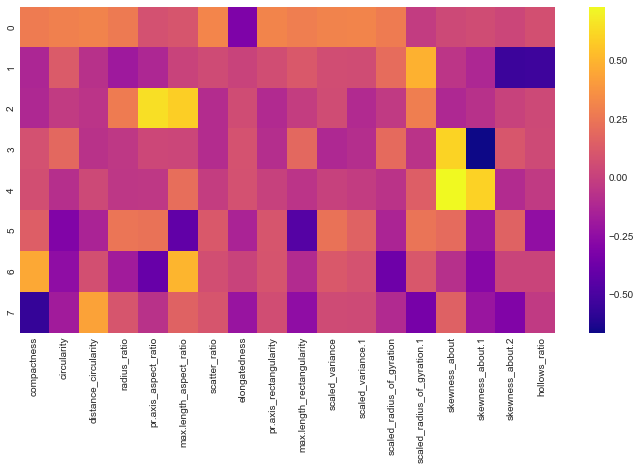

In [276]:
plt.figure(figsize=(12,6))
sns.heatmap(df_comp,cmap='plasma',)

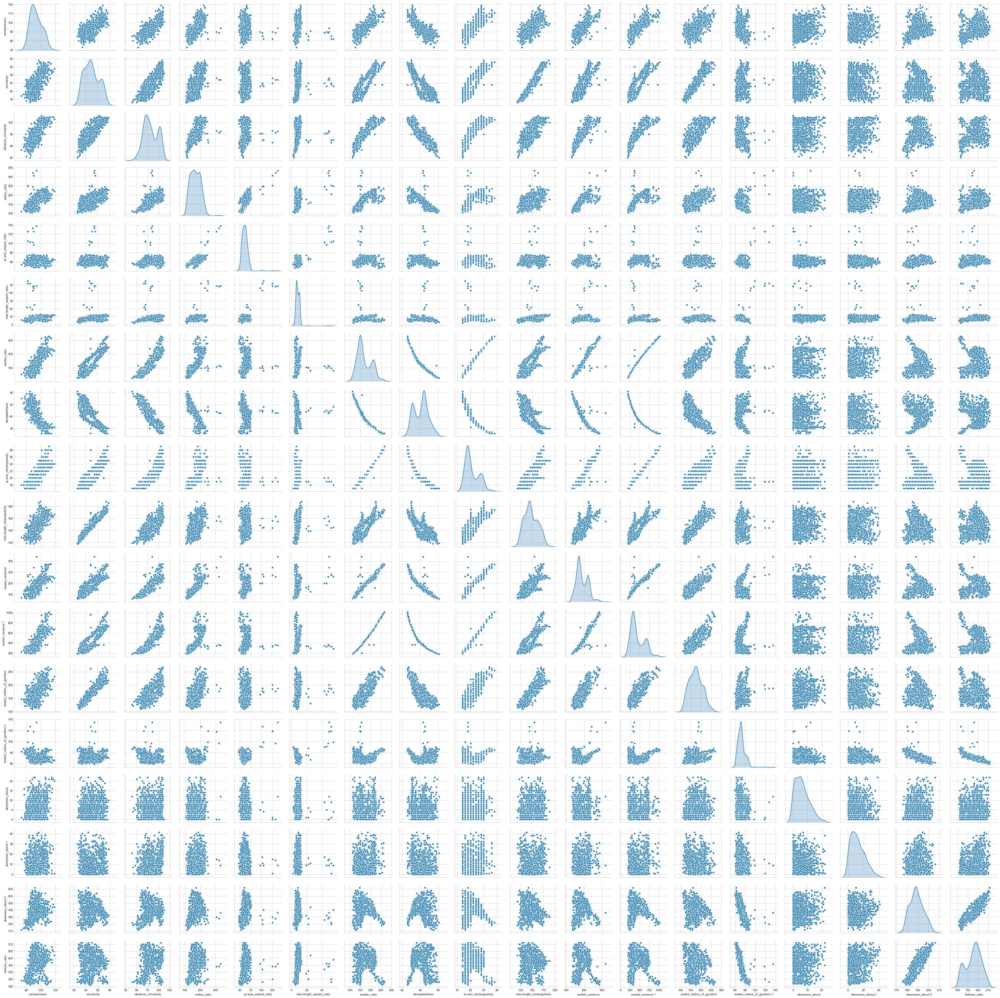

In [279]:
# independant variables
X_pca = newdf.drop(['class'], axis=1)
# the dependent variable
y_pca = newdf[['class']]

sns.pairplot(X_pca, diag_kind='kde')   # to plot density curve instead of histogram on the diag

In [280]:
from scipy.stats import zscore
XScaled = X_pca.apply(zscore)
XScaled.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,0.160580,0.518073,0.057177,0.273363,1.310398,0.311542,-0.207598,0.136262,-0.224342,0.758332,-0.401920,-0.341934,0.285705,-0.327326,-0.073812,0.380870,-0.312012,0.183957
1,-0.325470,-0.623732,0.120741,-0.835032,-0.593753,0.094079,-0.599423,0.520519,-0.610886,-0.344578,-0.593357,-0.619724,-0.513630,-0.059384,0.538390,0.156798,0.013265,0.452977
2,1.254193,0.844303,1.519141,1.202018,0.548738,0.311542,1.148719,-1.144597,0.935290,0.689401,1.097671,1.109379,1.392477,0.074587,1.558727,-0.403383,-0.149374,0.049447
3,-0.082445,-0.623732,-0.006386,-0.295813,0.167907,0.094079,-0.750125,0.648605,-0.610886,-0.344578,-0.912419,-0.738777,-1.466683,-1.265121,-0.073812,-0.291347,1.639649,1.529056
4,-1.054545,-0.134387,-0.769150,1.082192,5.245643,9.444962,-0.599423,0.520519,-0.610886,-0.275646,1.671982,-0.648070,0.408680,7.309005,0.538390,-0.179311,-1.450481,-1.699181


In [281]:
covMatrix = np.cov(XScaled, rowvar = False)
print(covMatrix)

[[ 1.00118343  0.68569786  0.79086299  0.69055952  0.09164265  0.14842463
   0.81358214 -0.78968322  0.81465658  0.67694334  0.76297234  0.81497566
   0.58593517 -0.24988794  0.23635777  0.15720044  0.29889034  0.36598446]
 [ 0.68569786  1.00118343  0.79325751  0.6216467   0.15396023  0.25176438
   0.8489411  -0.82244387  0.84439802  0.96245572  0.79724837  0.83693508
   0.92691166  0.05200785  0.14436828 -0.01145212 -0.10455005  0.04640562]
 [ 0.79086299  0.79325751  1.00118343  0.76794246  0.15864319  0.26499957
   0.90614687 -0.9123854   0.89408198  0.77544391  0.86253904  0.88706577
   0.70660663 -0.22621115  0.1140589   0.26586088  0.14627113  0.33312625]
 [ 0.69055952  0.6216467   0.76794246  1.00118343  0.66423242  0.45058426
   0.73529816 -0.79041561  0.70922371  0.56962256  0.79435372  0.71928618
   0.53700678 -0.18061084  0.04877032  0.17394649  0.38266622  0.47186659]
 [ 0.09164265  0.15396023  0.15864319  0.66423242  1.00118343  0.64949139
   0.10385472 -0.18325156  0.07969

In [289]:
pca = PCA(n_components=18)
pca.fit(XScaled)

PCA(copy=True, iterated_power='auto', n_components=18, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [290]:
print(pca.explained_variance_)

[9.40460261e+00 3.01492206e+00 1.90352502e+00 1.17993747e+00
 9.17260633e-01 5.39992629e-01 3.58870118e-01 2.21932456e-01
 1.60608597e-01 9.18572234e-02 6.64994118e-02 4.66005994e-02
 3.57947189e-02 2.74120657e-02 2.05792871e-02 1.79166314e-02
 1.00257898e-02 2.96445743e-03]


In [291]:
print(pca.components_)

[[ 2.75283688e-01  2.93258469e-01  3.04609128e-01  2.67606877e-01
   8.05039890e-02  9.72756855e-02  3.17092750e-01 -3.14133155e-01
   3.13959064e-01  2.82830900e-01  3.09280359e-01  3.13788457e-01
   2.72047492e-01 -2.08137692e-02  4.14555082e-02  5.82250207e-02
   3.02795063e-02  7.41453913e-02]
 [-1.26953763e-01  1.25576727e-01 -7.29516436e-02 -1.89634378e-01
  -1.22174860e-01  1.07482875e-02  4.81181371e-02  1.27498515e-02
   5.99352482e-02  1.16220532e-01  6.22806229e-02  5.37843596e-02
   2.09233172e-01  4.88525148e-01 -5.50899716e-02 -1.24085090e-01
  -5.40914775e-01 -5.40354258e-01]
 [-1.19922479e-01 -2.48205467e-02 -5.60143254e-02  2.75074211e-01
   6.42012966e-01  5.91801304e-01 -9.76283108e-02  5.76484384e-02
  -1.09512416e-01 -1.70641987e-02  5.63239801e-02 -1.08840729e-01
  -3.14636493e-02  2.86277015e-01 -1.15679354e-01 -7.52828901e-02
   8.73592034e-03  3.95242743e-02]
 [ 7.83843562e-02  1.87337408e-01 -7.12008427e-02 -4.26053415e-02
   3.27257119e-02  3.14147277e-02 -9.

In [292]:
print(pca.explained_variance_ratio_)

[5.21860337e-01 1.67297684e-01 1.05626388e-01 6.54745969e-02
 5.08986889e-02 2.99641300e-02 1.99136623e-02 1.23150069e-02
 8.91215289e-03 5.09714695e-03 3.69004485e-03 2.58586200e-03
 1.98624491e-03 1.52109243e-03 1.14194232e-03 9.94191854e-04
 5.56329946e-04 1.64497408e-04]


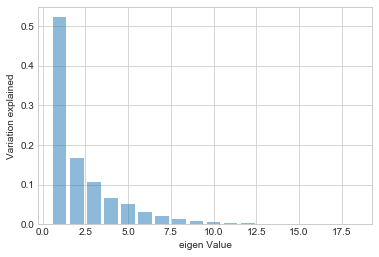

In [293]:
plt.bar(list(range(1,19)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

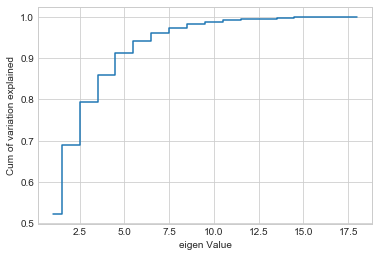

In [294]:
plt.step(list(range(1,19)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

# Dimensionality Reduction

In [395]:
pca8 = PCA(n_components = 8)
pca8.fit(XScaled)
print(pca8.components_)
print(pca8.explained_variance_ratio_)
Xpca8 = pca8.transform(XScaled)

[[ 2.75283688e-01  2.93258469e-01  3.04609128e-01  2.67606877e-01
   8.05039890e-02  9.72756855e-02  3.17092750e-01 -3.14133155e-01
   3.13959064e-01  2.82830900e-01  3.09280359e-01  3.13788457e-01
   2.72047492e-01 -2.08137692e-02  4.14555082e-02  5.82250207e-02
   3.02795063e-02  7.41453913e-02]
 [-1.26953763e-01  1.25576727e-01 -7.29516436e-02 -1.89634378e-01
  -1.22174860e-01  1.07482875e-02  4.81181371e-02  1.27498515e-02
   5.99352482e-02  1.16220532e-01  6.22806229e-02  5.37843596e-02
   2.09233172e-01  4.88525148e-01 -5.50899716e-02 -1.24085090e-01
  -5.40914775e-01 -5.40354258e-01]
 [-1.19922479e-01 -2.48205467e-02 -5.60143254e-02  2.75074211e-01
   6.42012966e-01  5.91801304e-01 -9.76283108e-02  5.76484384e-02
  -1.09512416e-01 -1.70641987e-02  5.63239801e-02 -1.08840729e-01
  -3.14636493e-02  2.86277015e-01 -1.15679354e-01 -7.52828901e-02
   8.73592034e-03  3.95242743e-02]
 [ 7.83843562e-02  1.87337408e-01 -7.12008427e-02 -4.26053415e-02
   3.27257119e-02  3.14147277e-02 -9.

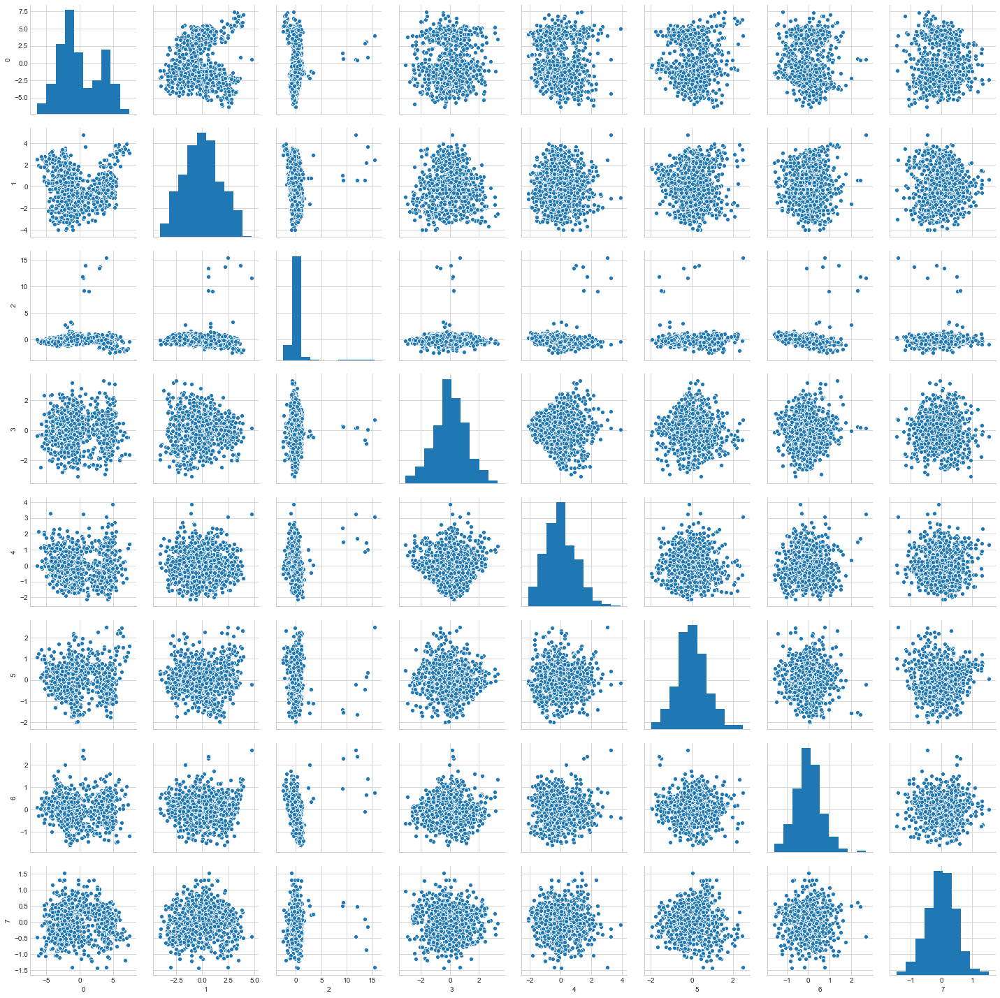

In [396]:
sns.pairplot(pd.DataFrame(Xpca8))

# Fit Linear Model

In [297]:
# Lets construct two linear models. The first with all the 18 independent variables and the second with 
# only the 8 new variables constructed using PCA.

# LinearRegression

In [401]:
from sklearn.linear_model import LinearRegression
regression_model = LinearRegression()
regression_model.fit(XScaled, y_pca)
print ('Before PCA score', regression_model.score(XScaled, y_pca))

regression_model_pca = LinearRegression()
regression_model_pca.fit(Xpca8, y_pca)
print ('After PCA score', regression_model_pca.score(Xpca8, y_pca))


Before PCA score 0.6602486689531759
After PCA score 0.44738619649715594


# LogisticRegression

In [398]:

model = LogisticRegression()

model.fit(XScaled, y_pca)
print ('Before PCA score', model.score(XScaled, y_pca))

model.fit(Xpca8, y_pca)
print ('After PCA score', model.score(Xpca8, y_pca))

print('Cross Validation Score [Scaled]', cross_val_score(model, XScaled, y, cv=10, scoring='accuracy').mean())
print('Cross Validation Score [PCA]', cross_val_score(model, Xpca8, y, cv=10, scoring='accuracy').mean())

Before PCA score 0.942080378250591
After PCA score 0.8321513002364066
Cross Validation Score [Scaled] 0.9338324110131857
Cross Validation Score [PCA] 0.8251407392225183


# Naive Bayes

In [352]:
nb = GaussianNB()

nb.fit(XScaled, y)
print ('Before PCA score', nb.score(XScaled, y_pca))

nb.fit(Xpca8, y)
print ('After PCA score', nb.score(Xpca8, y_pca))

print('Cross Validation Score [Scaled]', cross_val_score(nb, XScaled, y, cv=10, scoring='accuracy').mean())
print('Cross Validation Score [PCA]', cross_val_score(nb, Xpca8, y, cv=10, scoring='accuracy').mean())

Before PCA score 0.5957446808510638
After PCA score 0.83451536643026
Cross Validation Score [Scaled] 0.5922480699596911
Cross Validation Score [PCA] 0.8192723918835826


# Decision Tree

In [354]:
dt_model = DecisionTreeClassifier(criterion = 'entropy' )

dt_model.fit(XScaled, y_pca)
print ('Before PCA score', dt_model.score(XScaled, y))

dt_model.fit(Xpca8, y_pca)
print ('After PCA score', dt_model.score(Xpca8, y))

print('Cross Validation Score [Scaled]', cross_val_score(dt_model, XScaled, y, cv=10, scoring='accuracy').mean())
print('Cross Validation Score [PCA]', cross_val_score(dt_model, Xpca8, y, cv=10, scoring='accuracy').mean())

Before PCA score 1.0
After PCA score 1.0
Cross Validation Score [Scaled] 0.920819156931065
Cross Validation Score [PCA] 0.8322566099610575
